# SOM Analysis

By: Ty Janoski, Ph.D.

Updated: 12/9/2025

## Setup

In [1]:
# Import Statements
import gc

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmweather  # noqa: F401
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scienceplots  # noqa: F401
import xarray as xr
from minisom import MiniSom
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances

plt.style.use(["science", "nature", "grid"])
plt.rcParams["text.usetex"] = True
%config InlineBackend.figure_format = 'png'
%matplotlib inline


## Data Preprocessing

### NOAA Storm Events Database

In [2]:
# Read in CSV file containing flash flood events
df = pd.read_csv("data/storm_data_search_results.csv")

# Remove rows where EVENT_ID is not a digit
df = df[df["EVENT_ID"].astype(str).str.isdigit()]

# Turn BEGIN_TIME and END_TIME into strings with leading zeros if necessary
df["BEGIN_TIME"] = df["BEGIN_TIME"].fillna(0).astype(int).astype(str).str.zfill(4)
df["END_TIME"] = df["END_TIME"].fillna(0).astype(int).astype(str).str.zfill(4)

# Combine TIME and DATE into a single datetime string
begin_str = df["BEGIN_DATE"] + " " + df["BEGIN_TIME"] # type: ignore
end_str = df["END_DATE"] + " " + df["END_TIME"] # type: ignore

# Convert the datetime strings to pandas datetime objects
df["BEGIN_DATETIME"] = pd.to_datetime(
    begin_str, format="%m/%d/%Y %H%M", errors="coerce"
)
df["END_DATETIME"] = pd.to_datetime(end_str, format="%m/%d/%Y %H%M", errors="coerce")

# Double-check results
df[["BEGIN_DATE", "BEGIN_TIME", "BEGIN_DATETIME"]].head(10)


,BEGIN_DATE,BEGIN_TIME,BEGIN_DATETIME
0,07/03/1996,1520,1996-07-03 15:20:00
1,07/03/1996,1840,1996-07-03 18:40:00
2,07/08/1996,1829,1996-07-08 18:29:00
3,07/13/1996,0830,1996-07-13 08:30:00
4,07/31/1996,1010,1996-07-31 10:10:00
5,07/31/1996,1012,1996-07-31 10:12:00
6,07/31/1996,1012,1996-07-31 10:12:00
7,07/31/1996,1100,1996-07-31 11:00:00
8,07/31/1996,1100,1996-07-31 11:00:00
9,09/08/1996,1500,1996-09-08 15:00:00


In [3]:
# Take only the first row for each EPISODE_ID
df_unique = df.drop_duplicates(subset=["EPISODE_ID"], keep="first").copy()

# Create a list of datetimes rounded to the nearest preceding hour
event_hours = df_unique["BEGIN_DATETIME"].dt.floor("h").tolist() # type: ignore

In [ ]:
# df_unique["EPISODE_NARRATIVE"] = df_unique["EPISODE_NARRATIVE"].fillna("")

# keywords = [
#     "tropical",
#     "hurricane",
#     "post-tropical",
#     "tropical storm",
#     "tropical depression",
#     "remnants",
#     "remnant low",
# ]

# pattern = "(?:" + "|".join(keywords) + ")"

# df_unique["tropical_origin"] = df_unique["EPISODE_NARRATIVE"].str.contains(
#     pattern, case=False, na=False
# )

# # Exclude false positives
# df_unique["tropical_origin"] &= ~df_unique["EPISODE_NARRATIVE"].str.contains(
#     "non-tropical", case=False, na=False
# )

# # Manually override a few cases
# non_tc_dates = [
#     pd.Timestamp("2021-08-27 18:02:00"),
#     pd.Timestamp("2023-07-16 12:06:00"),
# ]
# tc_dates = [
#     pd.Timestamp("1996-09-08 15:00:00"),
# ]

# df_unique.loc[df_unique["BEGIN_DATETIME"].isin(non_tc_dates), "tropical_origin"] = False
# df_unique.loc[df_unique["BEGIN_DATETIME"].isin(tc_dates), "tropical_origin"] = True


In [ ]:
# df_no_tc = df_unique.loc[~df_unique["tropical_origin"]].copy()

# event_hours_no_tc = df_no_tc["BEGIN_DATETIME"].dt.floor("h").tolist() # type: ignore

### ERA5 Data

#### 500-mb Heights

##### Only create netCDF file if needed

In [6]:
# # Read in hourly, sliced Z500 heights
# Z500 = xr.open_mfdataset(
#     "/mnt/drive2/ERA5/NC_files/hourly_sliced/era5_z500_*.nc",
#     combine="nested",
#     concat_dim="time",
#     decode_times=True,
#     chunks={"time": 8760},
# ).rename({"var129": "Z500"})

# # Sort by time
# Z500 = Z500.sortby("time").Z500.squeeze()

# # Save out
# with ProgressBar():
#     Z500.rename("Z500").load()

# Z500.to_netcdf("/mnt/drive2/ERA5/NC_files/combined/era5_Z500_hourly_warm_season_US.nc")


In [69]:
# Read in ERA5 500 hPa geopotential height data
Z500 = xr.load_dataarray(
    "/mnt/drive2/ERA5/NC_files/combined/era5_Z500_hourly_warm_season_US.nc",
    decode_timedelta=True,
)

# Group by day of year to calculate mean and std dev
mean_doy = Z500.groupby("time.dayofyear").mean(dim="time")
std = Z500.std(dim="time")

# Calculate standardized anomalies
Z500_norm = (Z500.groupby("time.dayofyear") - mean_doy) / std

# Weight by square root of cosine of latitude
weights = np.sqrt(np.cos(np.deg2rad(Z500_norm.lat)))
Z500_norm_weighted = Z500_norm * weights


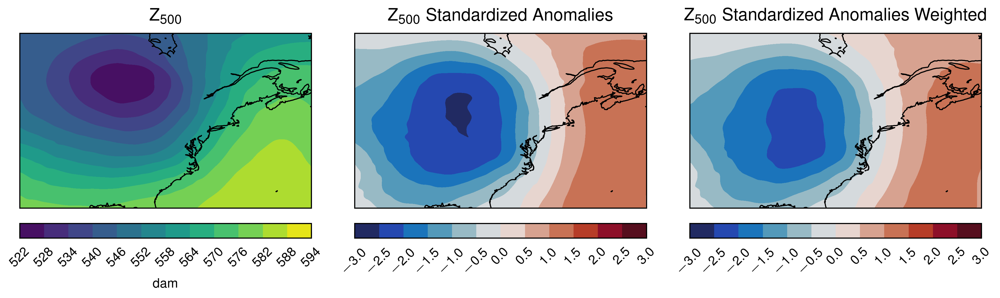

In [8]:
# Create figure and axes
fig, axs = plt.subplots(
    1, 3, figsize=(6.5, 3.5), subplot_kw={"projection": ccrs.PlateCarree()}, dpi=600
)

# Define plot configurations
configs = [
    {
        "data": Z500.isel(time=0) / 10 / 9.81,
        "lon": Z500.lon,
        "lat": Z500.lat,
        "title": "Z$_{500}$",
        "cmap": "viridis",
        "levels": np.arange(522, 595, 6),
    },
    {
        "data": Z500_norm.isel(time=0),
        "lon": Z500_norm.lon,
        "lat": Z500_norm.lat,
        "title": "Z$_{500}$ Standardized Anomalies",
        "cmap": "balance",
        "levels": np.arange(-3, 3.1, 0.5),
    },
    {
        "data": Z500_norm_weighted.isel(time=0),
        "lon": Z500_norm_weighted.lon,
        "lat": Z500_norm_weighted.lat,
        "title": "Z$_{500}$ Standardized Anomalies Weighted",
        "cmap": "balance",
        "levels": np.arange(-3, 3.1, 0.5),
    },
]

# Create plots and colorbars
for i, config in enumerate(configs):
    c = axs[i].contourf(
        config["lon"],
        config["lat"],
        config["data"],
        cmap=config["cmap"],
        levels=config["levels"],
    )
    axs[i].set_title(config["title"], fontsize=8)
    axs[i].coastlines(resolution="50m", linewidth=0.5)

    cb = fig.colorbar(c, ax=axs[i], orientation="horizontal", pad=0.03)
    if i == 0:
        cb.set_label("dam", fontsize=6)
    cb.set_ticks(c.levels)
    cb.ax.tick_params(labelsize=6, rotation=45)

plt.tight_layout()
plt.show()


In [70]:
# Extract data for event hours
# The times are actual NYC local, so we need to convert them to UTC
times_local = pd.to_datetime(event_hours).tz_localize("US/Eastern")
times_utc = times_local.tz_convert("UTC").tz_convert(None)

# Check to see if we get the same results with 6-hr lead/lag
times_utc = times_utc - pd.Timedelta("6hr")

intersect = pd.Index(times_utc).intersection(Z500_norm_weighted.indexes['time'])
Z500_norm_ffe = Z500_norm_weighted.sel(time=intersect)

In [71]:
# Check for missing times
missing = pd.Index(times_utc).difference(Z500_norm_weighted.indexes['time'])
missing

DatetimeIndex(['1997-11-02 13:00:00', '1999-01-03 12:00:00',
               '1999-01-15 08:00:00', '1999-01-18 21:00:00',
               '2006-11-08 13:00:00', '2007-04-27 06:00:00',
               '2018-04-16 04:00:00', '2018-12-21 08:00:00',
               '2023-04-30 15:00:00'],
              dtype='datetime64[ns]', freq=None)

It's okay that these are missing from the ERA5 dataset because we only downloaded the warm-season (May–Oct) data 😃

## SOM Analysis with MiniSom

### Reshape Data

In [72]:
# Flatten lat/lon into a single dimension
X = Z500_norm_ffe.stack(features=["lat", "lon"]).values  # shape: (time, space)

In [ ]:
# Save X out as a .dat for SOMPAK
# def write_sompak_dat(X: np.ndarray, filename: str = "sompak_input.dat"):
#     """Write data to a SOMPAK .dat file."""
#     n_samples, n_features = X.shape
#     with open(filename, "w") as f:
#         f.write(f"{n_features}\n")
#         for i in range(n_samples):
#             row = " ".join(f"{val:.6f}" for val in X[i])
#             f.write(row + "\n")
#     print(f"Wrote SOMPAK file: {filename}")

# write_sompak_dat(X, "Z500_ffe_sompak.dat")

In [73]:
# Free up a little memory
del Z500_norm_weighted, Z500_norm

Z500_ffe = Z500.sel(time=intersect)
del Z500

gc.collect()

59929

### Train SOM

We are going to use random initialization and online training (not batch). Note that we cannot use MiniSom's "train" function because that does not allow us to change the learning rate or neighborhood (sigma) to create a coarse → fine SOM.

In [86]:
xdim, ydim = 3, 2
n1, n2 = 2000, 8000
total = n1 + n2

sig1 = np.sqrt(xdim**2 + ydim**2)
sig2 = 1.5

lr1 = 0.1
lr2 = 0.01

random_seed = 42

som = MiniSom(
    xdim, ydim,
    input_len=X.shape[1],
    sigma=sig1,
    learning_rate=lr1,
    decay_function="linear_decay_to_zero",
    sigma_decay_function="linear_decay_to_one",
    neighborhood_function='gaussian',
    random_seed=random_seed,
)

# Initialize random weights
som.random_weights_init(X)

# Random training
som.train_random(X, n1, verbose=True)

# Phase 2
som._sigma = sig2
som._learning_rate = lr2
som.train_random(X, n2, verbose=True)

 [ 2000 / 2000 ] 100% - 0:00:00 left 
 quantization error: 54.07126269011316
 [ 8000 / 8000 ] 100% - 0:00:00 left 
 quantization error: 52.61164339716018


 [ 8000 / 8000 ] 100% - 0:00:00 left 
 quantization error: 53.72369700618236


In [87]:
# --- Flattened weights (grab once) ---
W = som.get_weights().reshape(xdim * ydim, -1)

# --- Standardize each node (z-score across features) ---
W_std = (W - W.mean(axis=1, keepdims=True)) / W.std(axis=1, keepdims=True)

# --- Correlation across nodes ---
CC = np.corrcoef(W_std)

# --- Extract upper-triangle pairs above threshold ---
thresh = 0.9
i_idx, j_idx = np.where(np.triu(CC, k=1) > thresh)

print("Highly correlated SOM node pairs:")
for i, j in zip(i_idx, j_idx):
    ix, iy = divmod(i, ydim)
    jx, jy = divmod(j, ydim)
    print(f"({ix},{iy}) ↔ ({jx},{jy})  |  CC = {CC[i,j]:.3f}")


Highly correlated SOM node pairs:
(0,0) ↔ (0,1)  |  CC = 0.920
(0,0) ↔ (1,0)  |  CC = 0.959
(0,0) ↔ (1,1)  |  CC = 0.969
(0,1) ↔ (1,1)  |  CC = 0.944
(1,0) ↔ (1,1)  |  CC = 0.922
(1,0) ↔ (2,0)  |  CC = 0.932
(1,0) ↔ (2,1)  |  CC = 0.931
(2,0) ↔ (2,1)  |  CC = 0.949


In [88]:
# --- Basic info ---
n_nodes = xdim * ydim

# --- 1. U-Matrix (map-level) ---
u_matrix = som.distance_map().T

# --- 2. BMUs & Hit Map ---
bmus = np.array([som.winner(x) for x in X])

hit_map = np.zeros((xdim, ydim))
for i, j in bmus:
    hit_map[i, j] += 1
hit_map = hit_map.T

# --- 3. Use already computed flattened weights ---
# W already exists from the correlation cell
weights = W  # alias for clarity

# --- 4. Node-level U values (neighbor distances per node) ---
U = np.zeros(n_nodes)
for idx in range(n_nodes):
    ix, iy = divmod(idx, ydim)
    neighbor_dists = []
    for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
        nx, ny = ix + dx, iy + dy
        if 0 <= nx < xdim and 0 <= ny < ydim:
            j = nx * ydim + ny
            neighbor_dists.append(np.linalg.norm(weights[idx] - weights[j]))
    U[idx] = np.mean(neighbor_dists)

# --- 5. Hit counts (flattened) ---
hits = np.zeros(n_nodes)
for i, j in bmus:
    hits[i * ydim + j] += 1

hits_scaled = 300 * hits / hits.max()

# --- 6. Sammon/MDS coordinates ---
D = pairwise_distances(weights)
coords = MDS(
    n_components=2, dissimilarity="precomputed", random_state=42
).fit_transform(D)


/home/janoski/miniforge3/envs/soms/lib/python3.13/site-packages/sklearn/manifold/_mds.py:677: FutureWarning: The default value of `n_init` will change from 4 to 1 in 1.9.
  warnings.warn(


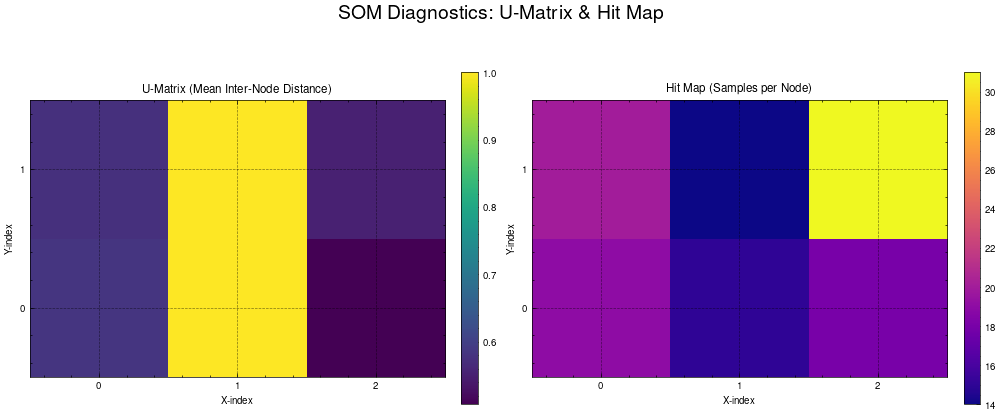

In [89]:
fig, axes = plt.subplots(1, 2, layout="constrained", figsize=(10, 4.5))

# --- U-Matrix ---
im0 = axes[0].imshow(u_matrix, cmap="viridis", origin="lower")
axes[0].set_title("U-Matrix (Mean Inter-Node Distance)")
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, shrink=0.8)

# --- Hit Map ---
im1 = axes[1].imshow(hit_map, cmap="plasma", origin="lower")
axes[1].set_title("Hit Map (Samples per Node)")
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, shrink=0.8)

# --- Axis styling (same for both) ---
for ax in axes:
    ax.set_xticks(np.arange(xdim))
    ax.set_yticks(np.arange(ydim))
    ax.set_xlabel("X-index")
    ax.set_ylabel("Y-index")

plt.suptitle("SOM Diagnostics: U-Matrix \\& Hit Map", fontsize=14)
plt.show()


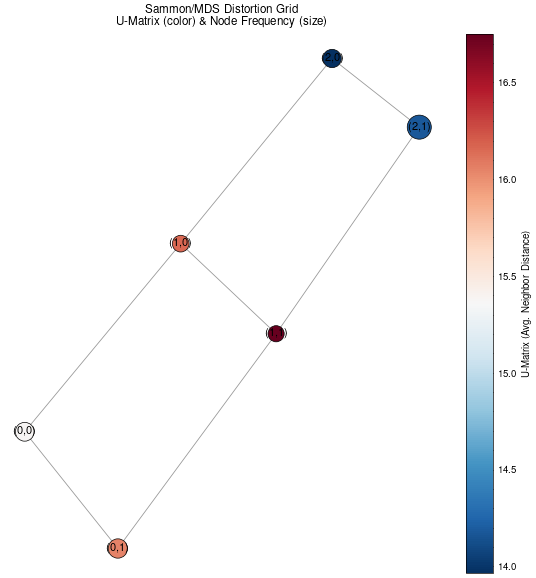

In [90]:
plt.figure(figsize=(7, 7))

# Scatter: U controls color, hits control bubble size
sc = plt.scatter(
    coords[:, 0], coords[:, 1],
    c=U, s=hits_scaled,
    cmap="RdBu_r", edgecolor="k", linewidth=0.5,
    zorder=3
)

# Draw lattice connections (right & down neighbors only, avoids duplicates)
for i in range(xdim):
    for j in range(ydim):
        node = i * ydim + j
        # right neighbor
        if j + 1 < ydim:
            nbr = i * ydim + (j + 1)
            plt.plot([coords[node, 0], coords[nbr, 0]],
                     [coords[node, 1], coords[nbr, 1]],
                     "k-", lw=0.6, alpha=0.4)
        # down neighbor
        if i + 1 < xdim:
            nbr = (i + 1) * ydim + j
            plt.plot([coords[node, 0], coords[nbr, 0]],
                     [coords[node, 1], coords[nbr, 1]],
                     "k-", lw=0.6, alpha=0.4)

# Node labels (i,j)
for idx, (x, y) in enumerate(coords):
    ix, iy = divmod(idx, ydim)
    plt.text(x, y, f"({ix},{iy})", fontsize=8,
             ha="center", va="center", zorder=5)

plt.title("Sammon/MDS Distortion Grid\nU-Matrix (color) \\& Node Frequency (size)")
plt.axis("off")
plt.colorbar(sc, label="U-Matrix (Avg. Neighbor Distance)")
plt.show()

In [91]:
lat = Z500_norm_ffe.lat
lon = Z500_norm_ffe.lon

# Dimensions of the spatial field
n_lat = lat.size
n_lon = lon.size

# Reshape into SOM-node grid: (xdim, ydim, lat, lon)
nodes = W.reshape(xdim, ydim, n_lat, n_lon)

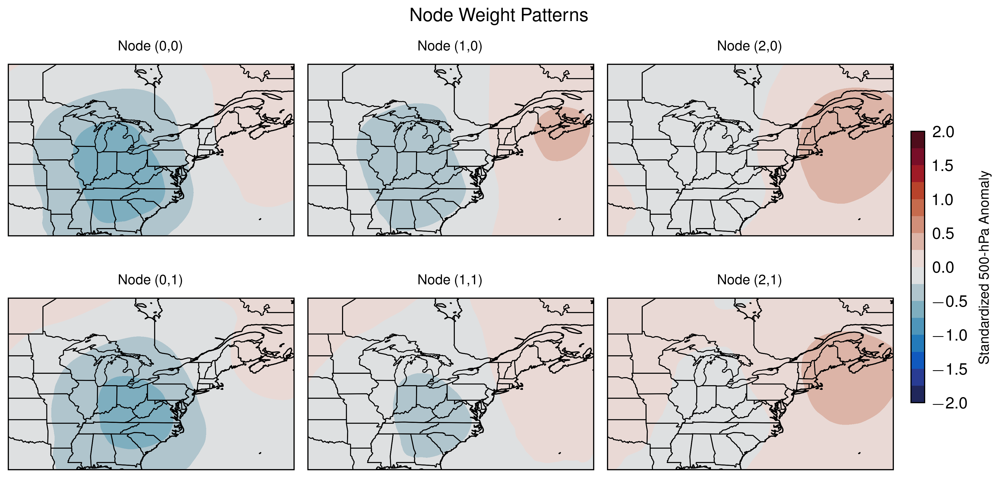

In [92]:
fig, axes = plt.subplots(
    ydim, xdim,
    figsize=(6, 3),
    subplot_kw={'projection': ccrs.PlateCarree()},
    constrained_layout=True,
    dpi=600
)

levels = np.arange(-2.0, 2.01, 0.25)

for i in range(xdim):
    for j in range(ydim):
        ax = axes[j, i]

        field = nodes[i, j, :, :]

        im = ax.contourf(
            lon, lat, field,
            cmap="balance",
            levels=levels,
            transform=ccrs.PlateCarree()
        )

        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.4)
        ax.set_title(f"Node ({i},{j})", fontsize=6)
        ax.set_xticks([])
        ax.set_yticks([])

# One shared colorbar
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6, pad=0.02)
cbar.set_label("Standardized 500-hPa Anomaly", fontsize=6)

plt.suptitle("Node Weight Patterns", fontsize=8)
plt.show()


In [93]:
# Create an empty numpy array to hold Z500 standardized anomalies
patterns = np.full((xdim, ydim, n_lat, n_lon), np.nan)
counts   = np.zeros((xdim, ydim), dtype=int)

for i in range(xdim):
    for j in range(ydim):
        # indices in this node
        idx = np.where((bmus[:, 0] == i) & (bmus[:, 1] == j))[0]
        counts[i, j] = len(idx)

        if len(idx) > 0:
            patterns[i, j] = Z500_norm_ffe.isel(time=idx).mean("time").values

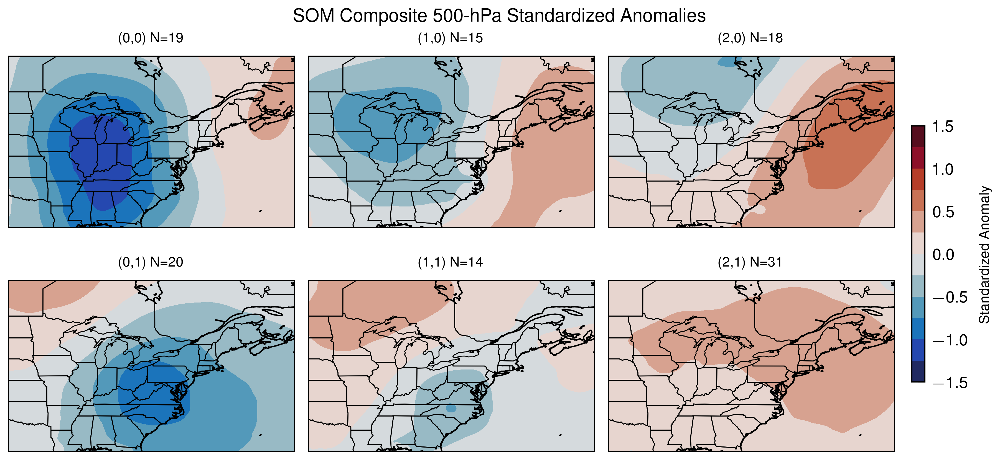

In [94]:
fig, axes = plt.subplots(
    ydim,
    xdim,
    figsize=(6, 2.7),
    subplot_kw={"projection": ccrs.PlateCarree()},
    constrained_layout=True,
    dpi=600,
)

for i in range(xdim):
    for j in range(ydim):
        ax = axes[j, i]
        field = patterns[i, j, :, :]

        im = ax.contourf(
            lon,
            lat,
            field,
            cmap="balance",
            levels=np.arange(-1.50, 1.51, 0.25),
            transform=ccrs.PlateCarree(),
        )

        ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
        ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.4)
        ax.set_title(f"({i},{j})  N={counts[i, j]}", fontsize=6)

        ax.set_xticks([])
        ax.set_yticks([])

# one colorbar
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6, pad=0.02)
cbar.set_label("Standardized Anomaly", fontsize=6)

plt.suptitle("SOM Composite 500-hPa Standardized Anomalies", fontsize=8, y=1.04)
plt.show()


In [95]:
# Repeat for Z500 heights
Z500_patterns = np.zeros((xdim, ydim, len(lat), len(lon)))
counts = np.zeros((xdim, ydim), dtype=int)

for i in range(xdim):
    for j in range(ydim):

        idx = np.where((bmus[:,0] == i) & (bmus[:,1] == j))[0]
        counts[i,j] = len(idx)

        if len(idx) == 0:
            Z500_patterns[i,j,:,:] = np.nan
        else:
            Z500_patterns[i,j,:,:] = (
                Z500_ffe.isel(time=idx).mean("time").values
            )

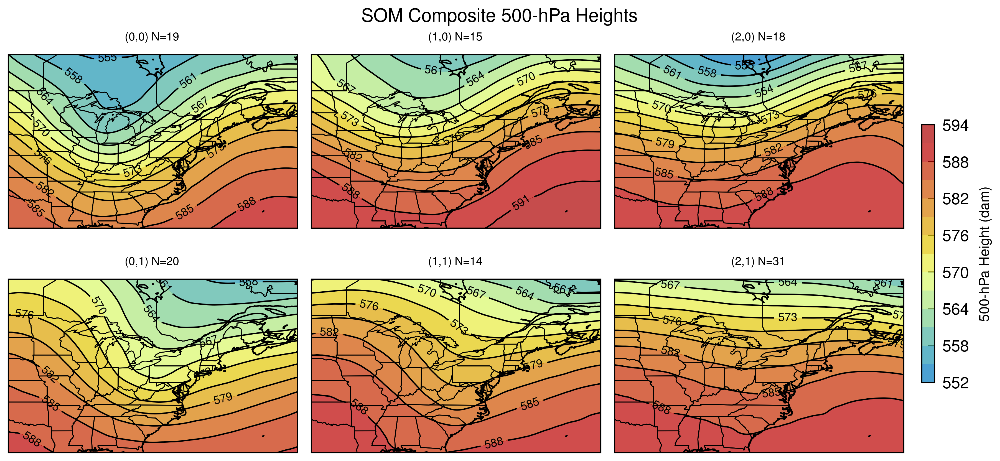

In [96]:
fig, axes = plt.subplots(
    ydim,
    xdim,
    figsize=(6, 2.7),
    subplot_kw={"projection": ccrs.PlateCarree()},
    constrained_layout=True,
    dpi=600,
)

for i in range(xdim):
    for j in range(ydim):
        ax = axes[j, i]
        field = Z500_patterns[i, j, :, :]

        c = ax.contour(
            lon,
            lat,
            field / 98.1,
            levels=range(552, 595, 3),
            colors="black",
            transform=ccrs.PlateCarree(),
            linewidths=0.6,
        )
        cf = ax.contourf(
            lon,
            lat,
            field / 10 / 9.81,
            cmap="HomeyerRainbow",
            levels=np.arange(552, 595, 3),
            transform=ccrs.PlateCarree(),
            alpha=0.7
        )

        ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
        ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.4)
        ax.set_title(f"({i},{j})  N={counts[i, j]}", fontsize=5)

        ax.set_xticks([])
        ax.set_yticks([])

        # Add inline labels
        ax.clabel(c, c.levels, fontsize=5)

# one colorbar
cbar = fig.colorbar(cf, ax=axes.ravel().tolist(), shrink=0.6, pad=0.02)
cbar.set_label("500-hPa Height (dam)", fontsize=6)

plt.suptitle("SOM Composite 500-hPa Heights", fontsize=8, y=1.04)
plt.show()


In [97]:
# pick your node of interest
node = (0,0)

# find which events belong to that node
idx = np.where((bmus[:, 0] == node[0]) & (bmus[:, 1] == node[1]))[0]

# get the corresponding datetimes
dates_in_node = Z500_ffe.time.isel(time=idx).values

print(f"Node {node} has {len(idx)} events:")
for t in dates_in_node:
    print(pd.to_datetime(str(t)).strftime("%Y-%m-%d %H:%M"))

Node (0, 0) has 19 events:
1996-07-08 16:00
1999-09-16 09:00
2003-07-22 13:00
2003-09-23 07:00
2004-06-25 15:00
2004-08-11 12:00
2006-10-28 10:00
2007-06-04 06:00
2008-06-22 12:00
2009-07-26 17:00
2009-07-29 12:00
2012-08-15 11:00
2012-09-08 08:00
2014-05-16 19:00
2014-06-13 15:00
2014-07-15 12:00
2017-05-05 08:00
2019-08-07 14:00
2022-09-13 02:00


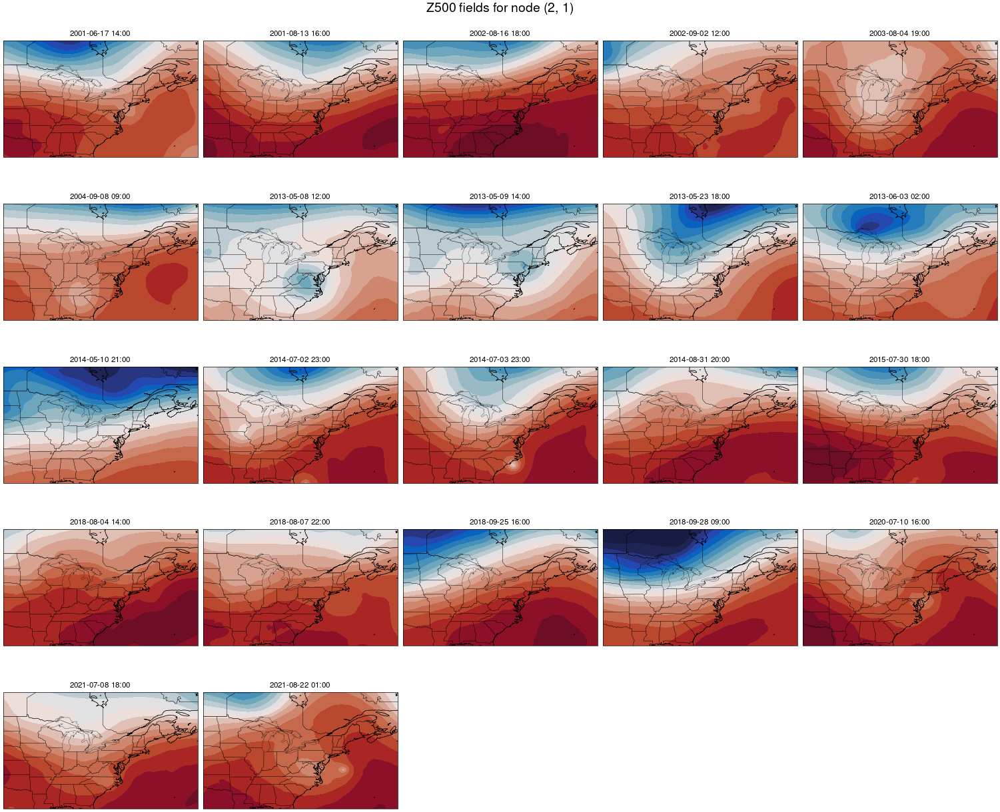

In [35]:
node = (2, 1)
idx = np.where((bmus[:, 0] == node[0]) & (bmus[:, 1] == node[1]))[0]
n = len(idx)

# choose number of columns for the plot
cols = 5
rows = int(np.ceil(n / cols))

proj = ccrs.PlateCarree()
fig, axes = plt.subplots(
    rows, cols, figsize=(3 * cols, 2.5 * rows), subplot_kw={"projection": proj}, layout="constrained"
)

for k, ax in enumerate(axes.flat):
    if k < n:
        t = idx[k]
        data = Z500_ffe.isel(time=t)
        im = ax.contourf(
            data.lon,
            data.lat,
            data / 10 / 9.81,
            levels=np.arange(540, 603, 3),
            cmap="balance",
            transform=proj,
            extend="both",
        )
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linewidth=0.3)
        ax.add_feature(cfeature.STATES, linewidth=0.2)
        ax.set_title(str(pd.to_datetime(data.time.values))[:16])
    else:
        ax.axis("off")

fig.suptitle(f"Z500 fields for node {node}", fontsize=14)
plt.show()


#### Total tcpw plots

In [72]:
import dask

# ---------------------------------------------------------
# Load efficiently
# ---------------------------------------------------------
tcwv = xr.open_mfdataset(
    "/mnt/drive2/ERA5/NC_files/hourly_sliced/era5_pw*.nc",
    combine="nested",
    concat_dim="time",
    chunks={"time": 24},
    decode_timedelta=True,
)

tcwv = tcwv.sortby("time").var137.sel(time=intersect)

# ---------------------------------------------------------
# Lazy pattern list
# ---------------------------------------------------------
pattern_list = []
count_list = []

for i in range(xdim):
    for j in range(ydim):

        idx = np.where((bmus[:, 0] == i) & (bmus[:, 1] == j))[0]
        count_list.append(len(idx))

        if len(idx) == 0:
            pattern_list.append(xr.full_like(tcwv.isel(time=0), np.nan))
        else:
            pattern_list.append(tcwv.isel(time=idx).mean("time"))

# ---------------------------------------------------------
# Compute everything at once
# ---------------------------------------------------------
computed = dask.compute(*pattern_list)   # << WORKS IN ALL XARRAY VERSIONS

# ---------------------------------------------------------
# Convert to numpy
# ---------------------------------------------------------
V_patterns = np.stack(computed).reshape(xdim, ydim, len(lat), len(lon))
counts = np.array(count_list).reshape(xdim, ydim)


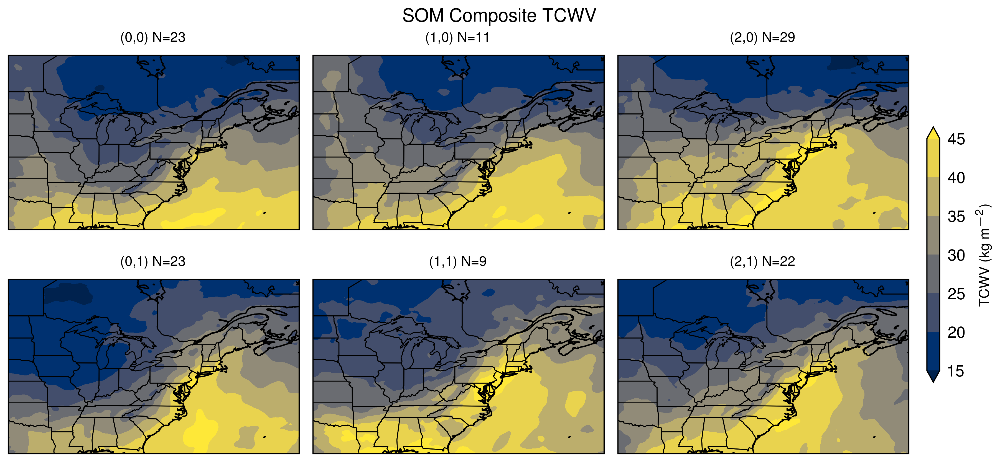

In [ ]:
fig, axes = plt.subplots(
    ydim, xdim,
    figsize=(6, 2.7),
    subplot_kw={'projection': ccrs.PlateCarree()},
    constrained_layout=True,
    dpi=600
)

levels = np.arange(15,46,5)

# ----------------------------------------------
# Loop through nodes and plot
# ----------------------------------------------
for i in range(xdim):
    for j in range(ydim):

        ax = axes[j, i]
        field = V_patterns[i, j, :, :]

        im = ax.contourf(
            lon, lat, field,
            cmap="cividis",       # choose your own colormap
            levels=levels,
            extend="both",
            transform=ccrs.PlateCarree()
        )

        ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
        ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.4)

        ax.set_title(f"({i},{j})  N={counts[i,j]}", fontsize=6)
        ax.set_xticks([])
        ax.set_yticks([])

# ----------------------------------------------
# Shared colorbar
# ----------------------------------------------
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6, pad=0.02)
cbar.set_label("TCWV (kg m$^{-2}$)", fontsize=6)

plt.suptitle("SOM Composite TCWV", fontsize=8, y=1.04)
plt.show()

In [99]:
months = pd.to_datetime(intersect).month.to_numpy()

month_counts = {}

for i in range(xdim):
    for j in range(ydim):

        # find time indices belonging to this node
        idx = np.where((bmus[:,0] == i) & (bmus[:,1] == j))[0]

        # grab their months
        node_months = months[idx]

        # histogram over months 1–12
        counts = np.bincount(node_months, minlength=13)[1:]  # drop 0-bin

        month_counts[(i,j)] = counts

month_counts

{(0, 0): array([ 0,  0,  0,  0,  0,  2,  6, 10,  2,  3,  0,  0]),
 (0, 1): array([0, 0, 0, 0, 2, 4, 7, 4, 4, 2, 0, 0]),
 (1, 0): array([0, 0, 0, 0, 0, 1, 2, 5, 2, 1, 0, 0]),
 (1, 1): array([0, 0, 0, 0, 0, 3, 4, 1, 1, 0, 0, 0]),
 (2, 0): array([ 0,  0,  0,  0,  1,  7, 10,  7,  3,  1,  0,  0]),
 (2, 1): array([0, 0, 0, 0, 4, 2, 5, 7, 4, 0, 0, 0])}

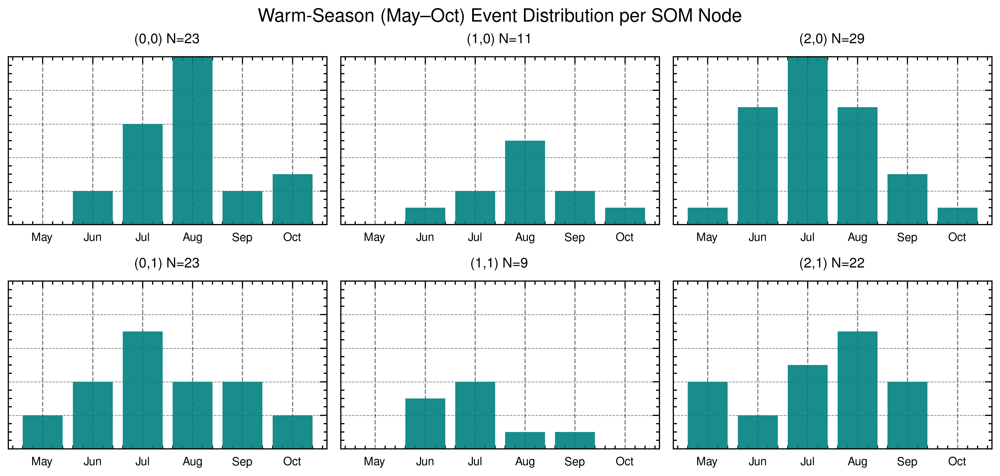

In [102]:
# =============================
# Monthly Histograms per SOM Node (May–Oct only)
# =============================

fig, axes = plt.subplots(
    ydim, xdim,
    figsize=(6, 2.7),
    constrained_layout=True,
    dpi=600
)

# Warm-season labels
month_labels = ["May", "Jun", "Jul", "Aug", "Sep", "Oct"]

for i in range(xdim):
    for j in range(ydim):

        ax = axes[j, i]

        # Extract May–Oct counts (months 5–10 → indices 4:10)
        counts = month_counts[(i, j)][4:10]

        ax.bar(
            month_labels,
            counts,
            color="teal",
            alpha=0.9,
            width=0.8
        )

        # Title matches your SOM composite style
        ax.set_title(f"({i},{j})  N={counts.sum()}", fontsize=6)

        # Remove ticks entirely (categorical labels don’t need them)
        ax.tick_params(axis="x", bottom=False, labelsize=5)
        ax.tick_params(axis="y", left=False, labelleft=False)

        # Shared, fixed y-axis across all panels
        ax.set_ylim(0, 10)

        # Light grid for readability
        ax.grid(True, linewidth=0.3, alpha=0.5, axis="y")

# Overall title
plt.suptitle("Warm-Season (May–Oct) Event Distribution per SOM Node", fontsize=8, y=1.04)

plt.show()


### Compare with SOM-PAK results

In [25]:
# --- User inputs ---
mapfile = "data/Z500_ffe_phase2.map"       # replace with your filename
lat = Z500_norm_ffe.lat.values          # 101
lon = Z500_norm_ffe.lon.values          # 141
xdim, ydim = 3, 3                       # your SOM grid size

n_nodes = xdim * ydim
n_feat = len(lat) * len(lon)            # 14241

# --- Read map ---
with open(mapfile, "r") as f:
    header = f.readline().strip()
    # header looks like: "14241 rect 3 3 gaussian"
    
    # Now read each node (one line per node)
    raw = [line.strip() for line in f if line.strip()]

# Convert lines to arrays
weights = np.array([np.fromstring(line, sep=" ") for line in raw])

print("weights shape:", weights.shape)
# Expect (9, 14241)

weights shape: (9, 14241)


In [26]:
# reshape into (xdim, ydim, n_lat, n_lon)
nodes = weights.reshape(xdim, ydim, len(lat), len(lon))

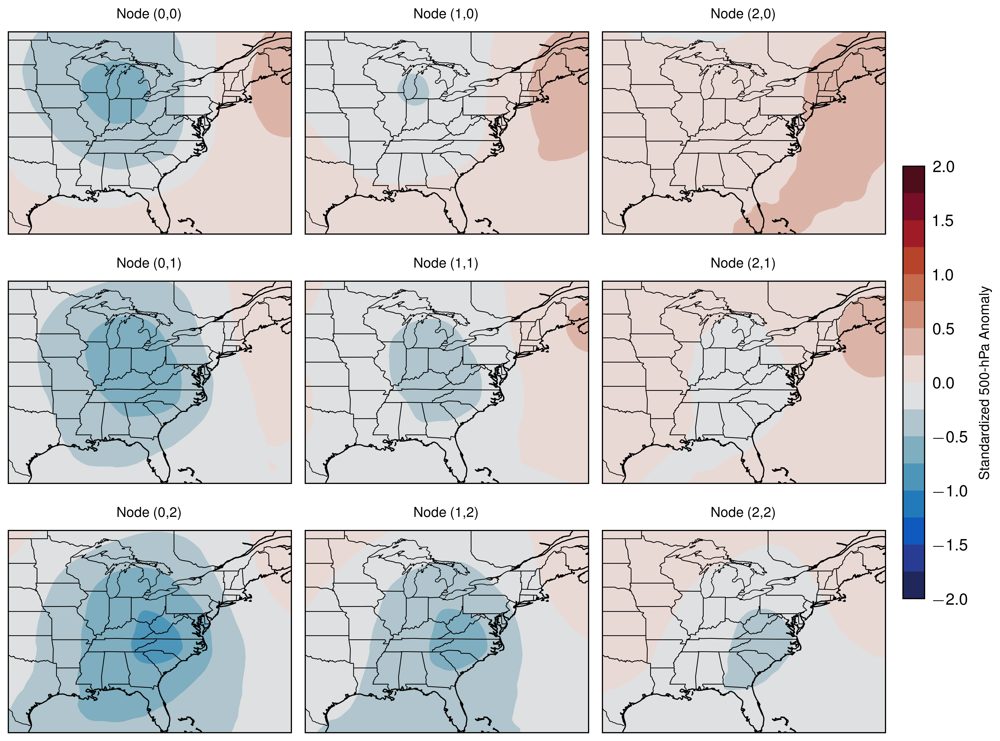

In [27]:
fig, axes = plt.subplots(
    ydim, xdim,
    figsize=(6, 4.5),
    subplot_kw={"projection": ccrs.PlateCarree()},
    constrained_layout=True,
    dpi=600
)

levels = np.arange(-2.0, 2.01, 0.25)

for i in range(xdim):
    for j in range(ydim):
        ax = axes[j, i]
        field = nodes[i, j]

        im = ax.contourf(
            lon, lat, field,
            cmap="balance",
            levels=levels,
            transform=ccrs.PlateCarree()
        )

        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.3)

        ax.set_title(f"Node ({i},{j})", fontsize=6)
        ax.set_xticks([])
        ax.set_yticks([])

# One shared colorbar
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6, pad=0.02)
cbar.set_label("Standardized 500-hPa Anomaly", fontsize=6)

plt.show()


In [28]:
# MiniSom weights: shape (xdim, ydim, n_features)
weights = som._weights.copy()   # <-- this is the important part

n_lat = len(lat)
n_lon = len(lon)

# Reshape into (xdim, ydim, n_lat, n_lon)
nodes = weights.reshape(xdim, ydim, n_lat, n_lon)

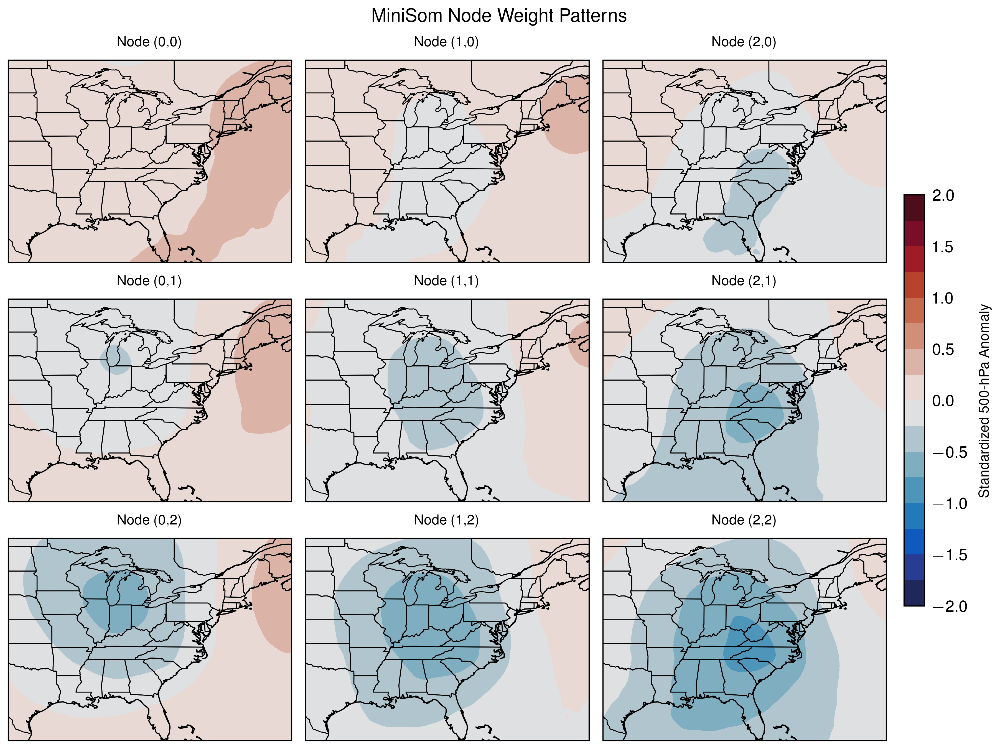

In [29]:
fig, axes = plt.subplots(
    ydim, xdim,
    figsize=(6, 4.5),
    subplot_kw={'projection': ccrs.PlateCarree()},
    constrained_layout=True,
    dpi=600
)

levels = np.arange(-2.0, 2.01, 0.25)

for i in range(xdim):
    for j in range(ydim):
        ax = axes[j, i]

        field = nodes[i, j, :, :]

        im = ax.contourf(
            lon, lat, field,
            cmap="balance",
            levels=levels,
            transform=ccrs.PlateCarree()
        )

        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.4)
        ax.set_title(f"Node ({i},{j})", fontsize=6)
        ax.set_xticks([])
        ax.set_yticks([])

# One shared colorbar
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6, pad=0.02)
cbar.set_label("Standardized 500-hPa Anomaly", fontsize=6)

plt.suptitle("MiniSom Node Weight Patterns", fontsize=8)
plt.show()


### Simple Composites

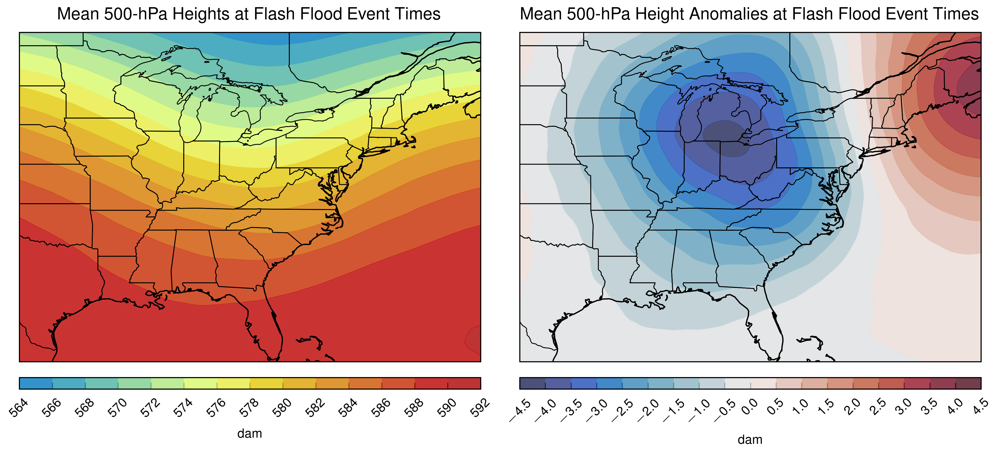

In [87]:
fig, axs = plt.subplots(
    1,
    2,
    figsize=(6.5, 3.5),
    dpi=600,
    subplot_kw={"projection": ccrs.PlateCarree()},
    layout="constrained",
)

cf = axs[0].contourf(
    lon,
    lat,
    Z500_ffe.mean("time") / 10,
    cmap="HomeyerRainbow",
    levels=np.arange(564, 593, 2),
    alpha=0.8,
)
axs[0].set_title("Mean 500-hPa Heights at Flash Flood Event Times", fontsize=8)
cb = fig.colorbar(
    cf, ax=axs[0], orientation="horizontal", pad=0.03, aspect=40, ticks=cf.levels
)
cb.set_label("dam", fontsize=6)
cb.ax.tick_params(labelsize=6, rotation=45)

cf = axs[1].contourf(
    lon,
    lat,
    Z500_anom.sel(time=intersect).mean("time") / 10,
    cmap="balance",
    levels=np.arange(-4.5, 4.6, 0.5),
    alpha=0.8,
)
axs[1].set_title("Mean 500-hPa Height Anomalies at Flash Flood Event Times", fontsize=8)
cb = fig.colorbar(
    cf, ax=axs[1], orientation="horizontal", pad=0.03, aspect=40, ticks=cf.levels
)
cb.set_label("dam", fontsize=6)
cb.ax.tick_params(labelsize=6, rotation=45)

for ax in axs:
    ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
    ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.4)

plt.show()
